In [1]:
%load_ext autoreload
%autoreload 2

import logging
logging.basicConfig(level=logging.INFO)

import numpy as np
# def __repr__(self):
#     return f'<np.ndarray of shape {self.shape} and dtype {self.dtype}>'
# np.set_string_function(__repr__)

import pandas as pd
pd.set_option("display.min_rows", 100)


from PIL import Image

# Перед использованием

- Установить `pip install git+https://github.com/epoch8/cv-pipeliner` (пока что в pip'е его нет, в будущем когда-то появится)

- Можно открыть https://miro.com/app/board/o9J_kuRIAWk=/ для упрощения понимания архитектуры кода.

# Для работы с изображениями мы пользуемся следующими датаклассами:

In [2]:
from cv_pipeliner import BboxData, ImageData

- Каждое изображение можно задать одним `ImageData`, каждый ббокс в изображении можно задать одним `BboxData`.

In [3]:
from pathlib import Path

MAIN_DIR = Path('.').absolute()
DATA_DIR = MAIN_DIR / 'examples'

In [4]:
image_path = DATA_DIR / '02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'
image_path

PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg')

# Как создать `ImageData` или `BboxData` с частичной ручной разметкой?

In [5]:
xmin1, ymin1, xmax1, ymax1 = 732, 558, 901, 656
label1 = 4447

xmin2, ymin2, xmax2, ymax2 = 639, 813, 702, 897
label2 = 3956

In [6]:
image_data_example_with_part_annot = ImageData(
    image_path=image_path,
    bboxes_data=[
        BboxData(
            image_path=image_path,
            xmin=xmin1,
            ymin=ymin1,
            xmax=xmax1,
            ymax=ymax1,
            label=label1,
            keypoints=[
                (xmin1+(xmax1-xmin1)/2, ymin1+(ymax1-ymin1)/2),
                (xmin1+(xmax1-xmin1)/3, ymin1+(ymax1-ymin1)/3),
                (xmin1+(xmax1-xmin1)/4, ymin1+(ymax1-ymin1)/4)
            ],  # кейпоинты внутри ббокса
            mask=[
                [[732,569],[740,561],[897,638],[895,649],[885,650],[880,648],[845,626]]
            ]  # маска внутри ббокса
        ),
        BboxData(
            image_path=image_path,
            xmin=xmin2,
            ymin=ymin2,
            xmax=xmax2,
            ymax=ymax2,
            label=label2,
            keypoints=[
                (xmax2-(xmax2-xmin2)/2, ymax2-(ymax2-ymin2)/2),
                (xmax2-(xmax2-xmin2)/3, ymax2-(ymax2-ymin2)/3),
                (xmax2-(xmax2-xmin2)/4, ymax2-(ymax2-ymin2)/4)
            ],  # кейпоинты внутри ббокса
            mask=[
                [[641,852],[647,823],[687,812],[688,820],[683,842],[699,876],[699,881],[664,893],[660,893]],
                [[667,832],[672,832],[673,837],[668,841],[661,841],[660,837],[664,833]],
                [[672,862],[676,863],[679,867],[677,872],[671,872],[668,868],[669,864]],
            ]  # маска внутри ббокса состоит из трех полигонов, причем две полигоны -- дырки
        )
    ],
    keypoints=[]  # кейпоинты в исходном изображении
)

In [7]:
image_data_example_with_part_annot

ImageData(image_path=BasePath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'), label=None, keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, bboxes_data=[BboxData(image_path=BasePath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'), label='4447', keypoints=array([[816, 607],
       [788, 590],
       [774, 582]]), detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, xmin=732, ymin=558, xmax=901, ymax=656, additional_bboxes_data=[]), BboxData(image_path=BasePath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'), label='3956', keypoints=array([[670, 855],
       [681, 869],
       [686, 876]]), detection_score=None, classification_score=None, add

# Как визуализировать `ImageData` и `BboxData`?

### Несколько способов: 

In [8]:
from cv_pipeliner import visualize_image_data

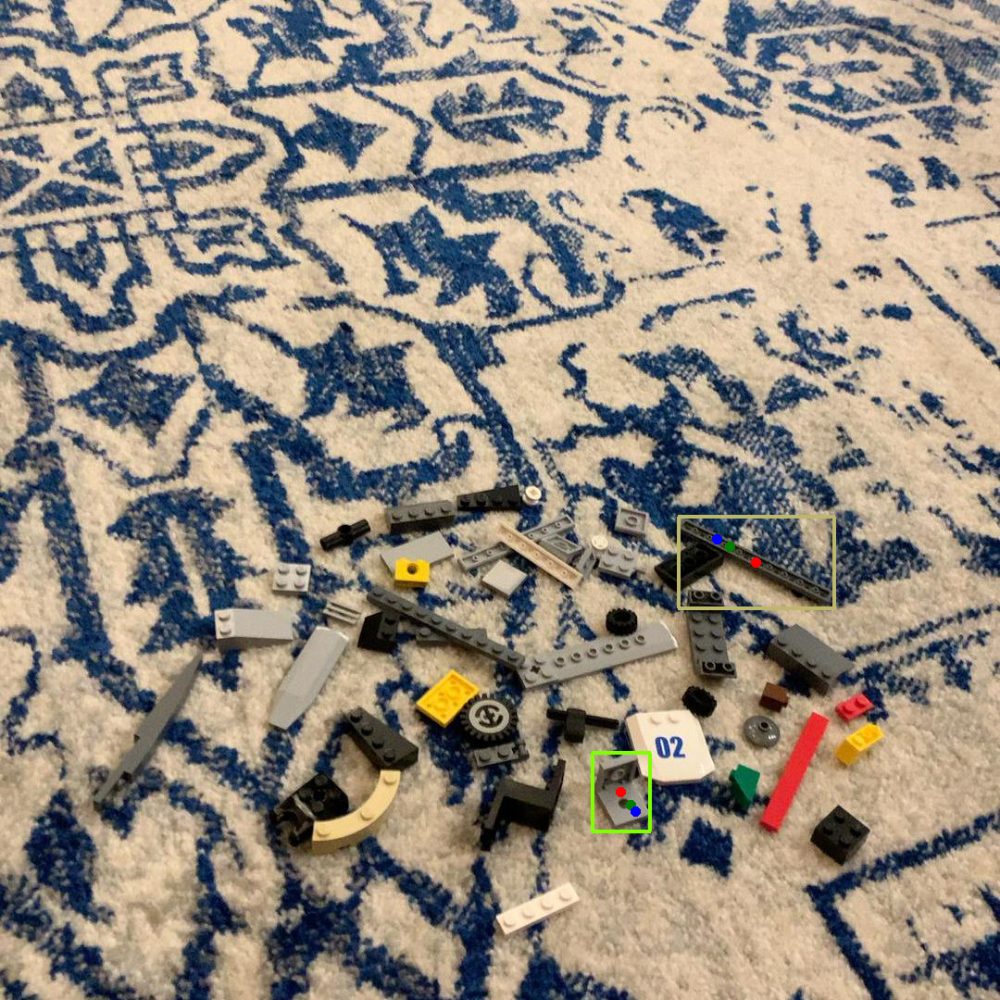

In [9]:
Image.fromarray(visualize_image_data(image_data_example_with_part_annot))

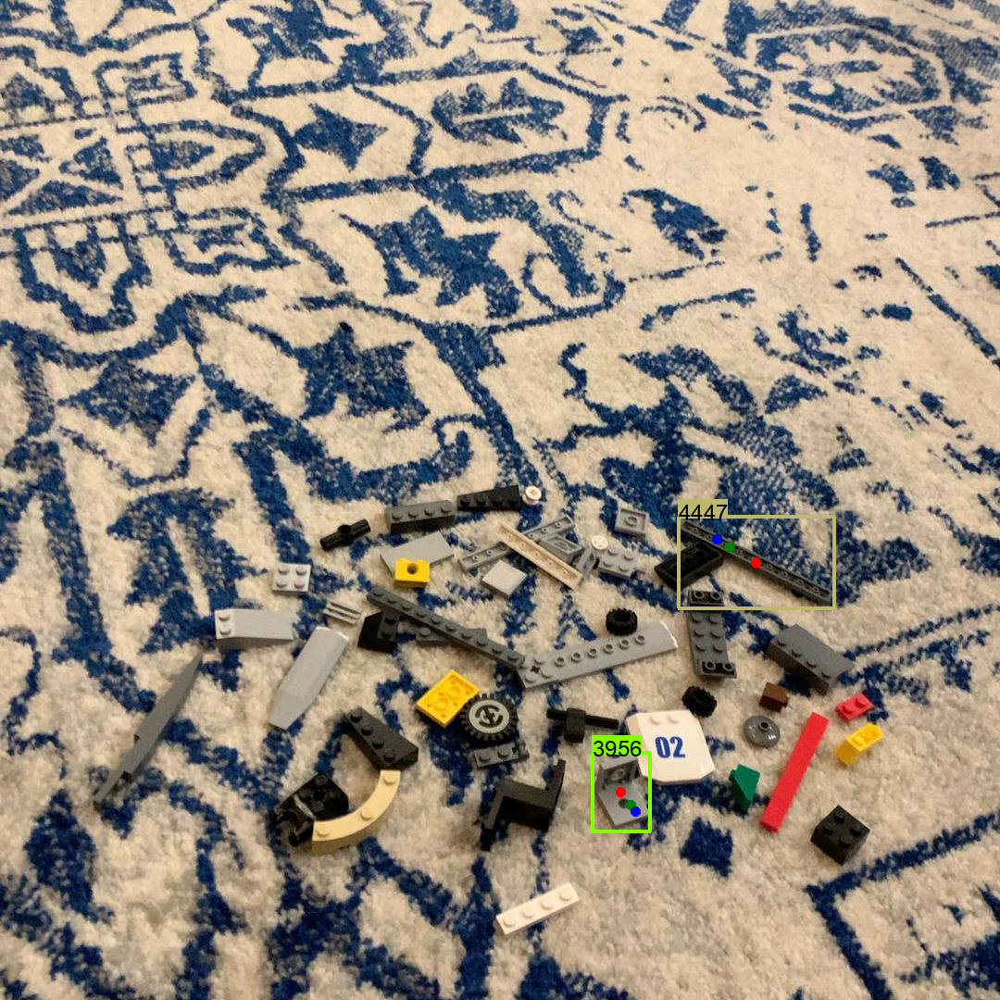

In [10]:
Image.fromarray(visualize_image_data(image_data_example_with_part_annot, include_labels=True))

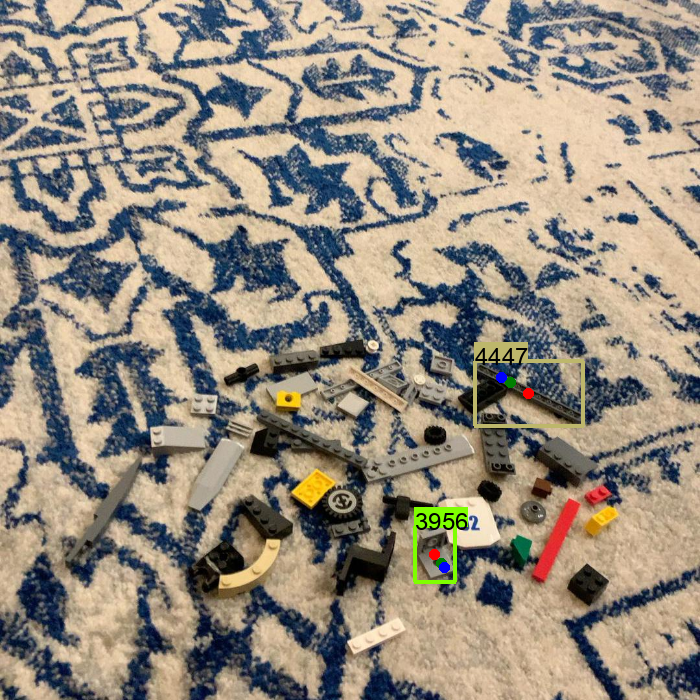

In [11]:
visualize_image_data(image_data_example_with_part_annot, include_labels=True, return_as_pil_image=True, thumbnail_size=700)

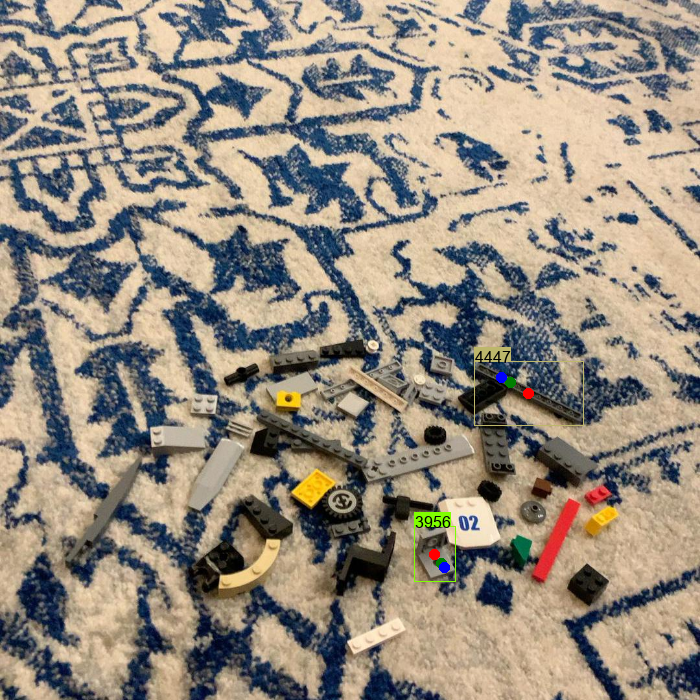

In [12]:
visualize_image_data(
    image_data_example_with_part_annot, include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1
)

## Можно отрисовать даже какую-то маску -- маска может содержать в себя дырку!

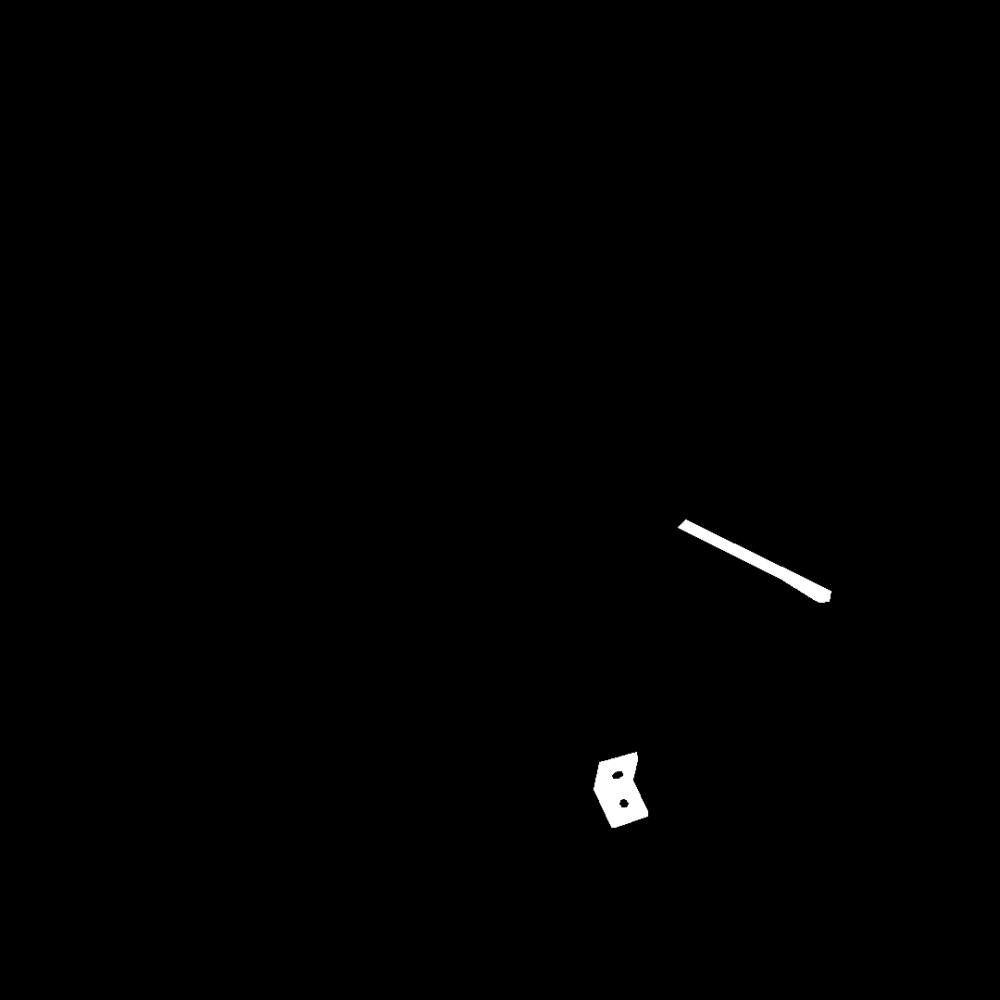

In [13]:
Image.fromarray(image_data_example_with_part_annot.open_mask())

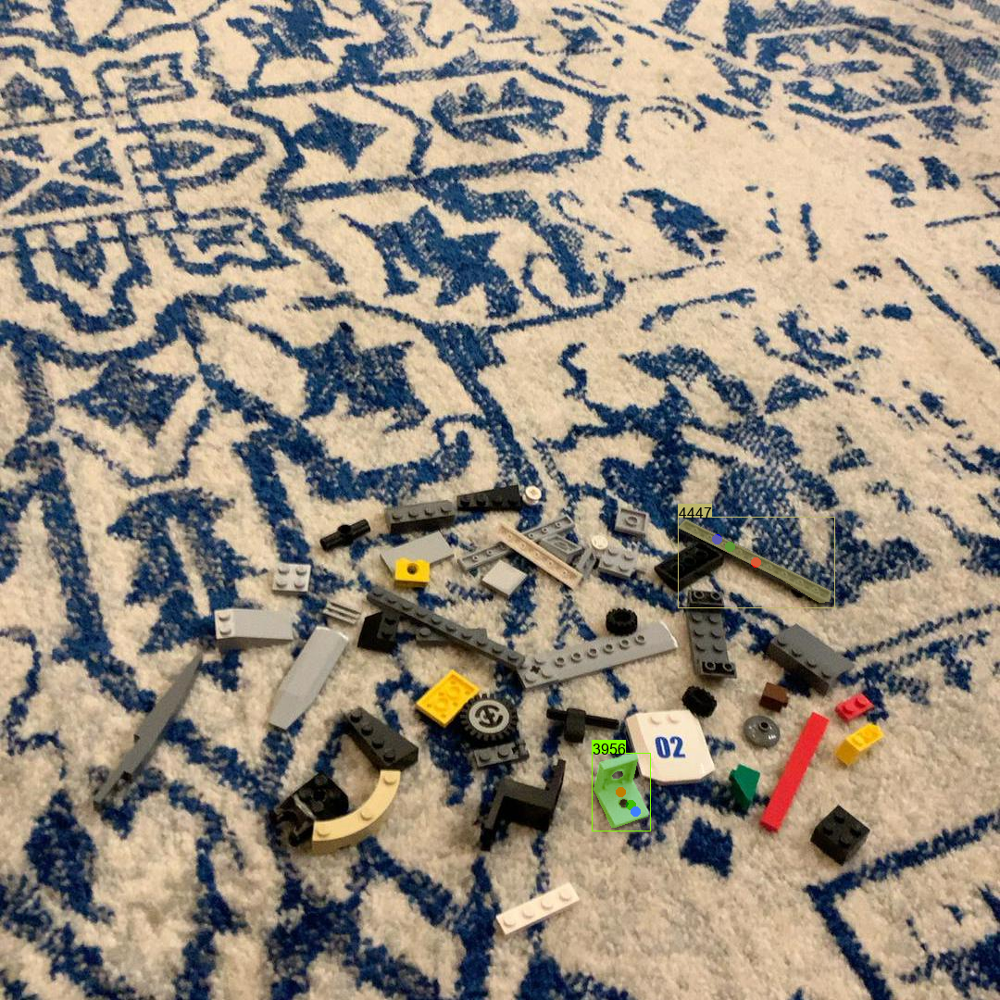

In [14]:
visualize_image_data(
    image_data_example_with_part_annot, include_labels=True, return_as_pil_image=True,
    fontsize=16, thickness=1, include_mask=True
)

### Как отрезать ббоксы?

(732, 558, 901, 656)
(732, 558, 901, 656)
label: 4447


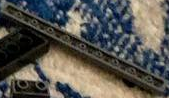

===
(639, 813, 702, 897)
(639, 813, 702, 897)
label: 3956


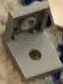

===


In [15]:
for bbox_data in image_data_example_with_part_annot.bboxes_data:
    print((bbox_data.xmin, bbox_data.ymin, bbox_data.xmax, bbox_data.ymax))
    print(bbox_data.coords)
    print("label:", bbox_data.label)
    cropped_image = bbox_data.open_cropped_image()  # возвращает np.array
    display(Image.fromarray(cropped_image))
    print("===")

### Можно даже отрезать ббоксы с некоторым оффсетом

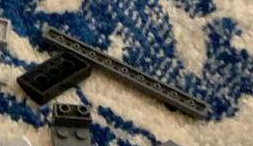

===


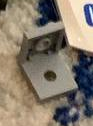

===


In [16]:
for bbox_data in image_data_example_with_part_annot.bboxes_data:
    cropped_image = bbox_data.open_cropped_image(
        xmin_offset=0.25,
        ymin_offset=0.25,
        xmax_offset=0.25,
        ymax_offset=0.25
    )  # возвращает np.array
    display(Image.fromarray(cropped_image))
    print("===")

(732, 558, 901, 656)
(732, 558, 901, 656)
label: 4447


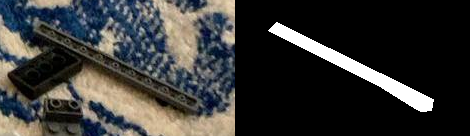

===
(639, 813, 702, 897)
(639, 813, 702, 897)
label: 3956


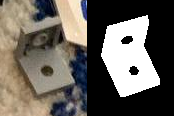

===


In [17]:
from cv_pipeliner.utils.images import concat_images

for bbox_data in image_data_example_with_part_annot.bboxes_data:
    print((bbox_data.xmin, bbox_data.ymin, bbox_data.xmax, bbox_data.ymax))
    print(bbox_data.coords)
    print("label:", bbox_data.label)
    cropped_image = bbox_data.open_cropped_image(
        xmin_offset=0.2, ymin_offset=0.2, xmax_offset=0.2, ymax_offset=0.2
    )  # возвращает np.array
    mask = bbox_data.open_cropped_mask(
        xmin_offset=0.2, ymin_offset=0.2, xmax_offset=0.2, ymax_offset=0.2
    )  # возвращает np.array
    image = concat_images(cropped_image, mask)
    display(Image.fromarray(image))
    print("===")

### Можно даже открыть bbox_data как отдельный image_data (для многоступенчатых разметок, когда внутри ббокса есть свои ббоксы/кейпоинты)

ImageData(image_path=None, label='4447', keypoints=array([[126,  73],
       [ 98,  56],
       [ 84,  48]]), detection_score=None, classification_score=None, additional_info={}, meta_width=253, meta_height=146, bboxes_data=[])

array([[[ 45,  70, 101],
        [ 17,  42,  73],
        [  1,  25,  59],
        ...,
        [183, 169, 143],
        [185, 173, 147],
        [175, 163, 137]],

       [[ 57,  80, 112],
        [ 17,  42,  73],
        [  0,  22,  56],
        ...,
        [184, 169, 140],
        [196, 182, 153],
        [202, 187, 158]],

       [[ 29,  52,  84],
        [  8,  31,  63],
        [  1,  26,  57],
        ...,
        [195, 178, 148],
        [191, 176, 145],
        [189, 172, 142]],

       ...,

       [[166, 153, 144],
        [158, 146, 134],
        [172, 160, 146],
        ...,
        [179, 160, 130],
        [181, 162, 132],
        [177, 158, 128]],

       [[162, 149, 140],
        [154, 142, 130],
        [167, 155, 141],
        ...,
        [169, 150, 120],
        [175, 156, 126],
        [173, 154, 124]],

       [[161, 148, 139],
        [151, 139, 127],
        [164, 152, 140],
        ...,
        [164, 145, 115],
        [173, 154, 124],
        [174, 155, 125]]

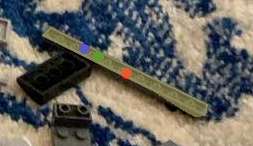

===


ImageData(image_path=None, label='3956', keypoints=array([[46, 63],
       [57, 77],
       [62, 84]]), detection_score=None, classification_score=None, additional_info={}, meta_width=93, meta_height=126, bboxes_data=[])

array([[[ 16,  12,   0],
        [ 19,  15,   3],
        [ 35,  32,  17],
        ...,
        [241, 227, 214],
        [248, 232, 216],
        [246, 229, 211]],

       [[ 24,  20,   9],
        [ 19,  15,   3],
        [ 26,  22,  10],
        ...,
        [243, 232, 230],
        [250, 236, 233],
        [245, 230, 223]],

       [[ 25,  21,  10],
        [ 16,  12,   0],
        [ 20,  16,   4],
        ...,
        [232, 224, 237],
        [231, 221, 232],
        [248, 239, 244]],

       ...,

       [[219, 194, 164],
        [209, 184, 154],
        [197, 172, 142],
        ...,
        [163, 148, 127],
        [171, 156, 135],
        [177, 162, 141]],

       [[220, 195, 165],
        [210, 185, 155],
        [199, 174, 144],
        ...,
        [162, 147, 124],
        [166, 151, 128],
        [171, 156, 133]],

       [[214, 189, 159],
        [208, 183, 153],
        [200, 175, 145],
        ...,
        [164, 149, 126],
        [167, 152, 129],
        [172, 157, 134]]

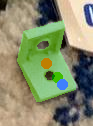

===


In [18]:
for bbox_data in image_data_example_with_part_annot.bboxes_data:
    cropped_image_data = bbox_data.open_cropped_image(
        xmin_offset=0.25,
        ymin_offset=0.25,
        xmax_offset=0.25,
        ymax_offset=0.25,
        return_as_image_data=True
    )  # возвращает ImageData, кропнутая картинка сохраняется в cropped_image_data.image
    display(cropped_image_data)
    display(cropped_image_data.image)
    display(visualize_image_data(cropped_image_data, include_keypoints=True, include_mask=True, return_as_pil_image=True))
    print("===")

# Как читать данные c разметкой?

## Из image_data в формате json

In [19]:
image_paths = sorted(DATA_DIR.glob('*.jpeg'))

In [20]:
image_paths

[PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/16cf6980-373e-47b8-b827-eadeecafebbf.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/1e8e177c-683e-4bb7-b3b8-35055905f13c.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/285c93d5-1998-4c02-bc15-f6254abd58ea.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/30ea5a62-9978-43e9-beb2-aff2bfd3898a.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/35f20998-47ff-4d74-b2d9-245edc3dec32.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/3c2d1284-10ca-4518-8e09-8a1e9f30c009.jpeg'),
 PosixPath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/5b245727-d829-4cd7-b078-f8f2ff436d84.

In [21]:
images_data = [
    ImageData.from_json(DATA_DIR / f"{image_path.stem}.json")
    for image_path in image_paths
]

In [22]:
images_data[0]

ImageData(image_path=BasePath('examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'), label=None, keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={'tag': 'normal'}, meta_width=None, meta_height=None, bboxes_data=[BboxData(image_path=BasePath('/home/jovyan/epoch8/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'), label='4477', keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, xmin=732, ymin=558, xmax=901, ymax=656, additional_bboxes_data=[]), BboxData(image_path=BasePath('/home/jovyan/epoch8/cv-pipeliner/docs/examples/02defb3b-d4f4-4b1a-ae3a-d5925fcb1de2.jpeg'), label='45677', keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, xmin=674, ymin=766, xmax=773, ymax=850, additional_bboxes_data=[]), BboxData(i

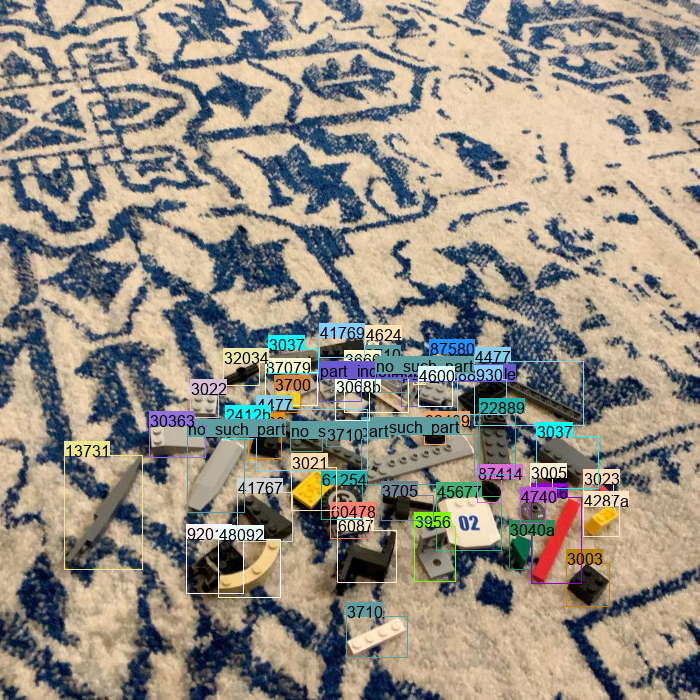

In [23]:
visualize_image_data(
    images_data[0], include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1
)

## На примере формата разметки из brickit-ml (из старого архива)

In [24]:
from cv_pipeliner import BrickitDataConverter

In [25]:
import json
brickit_annot = DATA_DIR / 'annotations_birckit_ml_type.json'

In [26]:
image_paths = image_paths

In [27]:
images_data = BrickitDataConverter().get_images_data_from_annots(DATA_DIR, brickit_annot)

In [28]:
images_data[0]

ImageData(image_path=BasePath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/285c93d5-1998-4c02-bc15-f6254abd58ea.jpeg'), label=None, keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={'tag': 'normal'}, meta_width=None, meta_height=None, bboxes_data=[BboxData(image_path=BasePath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/285c93d5-1998-4c02-bc15-f6254abd58ea.jpeg'), label='25269', keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, xmin=245, ymin=503, xmax=280, ymax=535, additional_bboxes_data=[]), BboxData(image_path=BasePath('/home/jovyan/epoch8/aci/aci_datapipe/libs/cv-pipeliner/docs/examples/285c93d5-1998-4c02-bc15-f6254abd58ea.jpeg'), label='3024', keypoints=array([], shape=(0, 2), dtype=int64), detection_score=None, classification_score=None, additional_info={}, meta_widt

---

# Работа с моделями

- Имеются два вида объектов для работы с моделями: низкоуровневые (InferenceModel, np.ndarray) и высокоуровневые (Inferencer, BboxData, ImageData, BatchGenerator)

- На вход низкоуровневым классам (inference_models) детектору и пайплайну подаем `List[np.ndarray]`, на вход классификатору -- `List[List[np.ndarray]]`.

- На вход высокоуровневым классам (inferencer) детектору и пайплайну подаем генератор `BatchGeneratorImageData`, на вход классификатору -- `BatchGeneratorBboxData`.

## Генераторы ImageData и BboxData

- Высокоуровневые модели в качестве входа принимает так и сами данные, так и через генераторы соответствующих данных из `ImageData` или `BboxData`. 
- Генераторы сами открывают нужные изображения и всегда возвращает копии соответствуюихся объектов.

In [29]:
from cv_pipeliner import BatchGeneratorImageData

In [30]:
images_data_gen = BatchGeneratorImageData(data=images_data, batch_size=3)

In [31]:
for i, images_data_batch in enumerate(images_data_gen):
    print(f"{i}th batch => {len(images_data_batch)} images")

0th batch => 3 images
1th batch => 3 images
2th batch => 3 images
3th batch => 1 images


In [32]:
MODELS_DIR = Path(
    '/notebooks/ceph-data/brickit-ml/'
)

# Детекция

In [33]:
MINIMUM_IOU = 0.5

# Как загрузить модель детекции, сделать инференс, посчитать метрики, провизуализировать и сделать отчет?

In [34]:
!nvidia-smi

Tue Aug 13 20:03:31 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.67                 Driver Version: 550.67         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 Ti     Off |   00000000:01:00.0 Off |                  N/A |
|  0%   46C    P0             18W /  165W |       1MiB /  16380MiB |    100%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### Загрузка модели

### Пути могут быть облачными! типа gs:// или s3://

In [35]:
# Для Object Detection API 2.0

# from cv_pipeliner import ObjectDetectionAPI_ModelSpec
# DETECTION_MODEL_SPEC = ObjectDetectionAPI_ModelSpec(
#     config_path='/notebooks/ceph-data/brickit-ml/models_detection/200815_centernet50_with_renders_and_real_data/pipeline.config',
#     checkpoint_path='/notebooks/ceph-data/brickit-ml/models_detection/200815_centernet50_with_renders_and_real_data/checkpoint/ckpt-102'
# )
# DETECTION_SCORE_THRESHOLD = 0.35


# Для Object Detection API 1.0

# from cv_pipeliner import ObjectDetectionAPI_pb_ModelSpec
# DETECTION_MODEL_SPEC = ObjectDetectionAPI_pb_ModelSpec(
#     saved_model_dir='/notebooks/ceph-data/brickit-ml/models_detection/logs/2020-03-20_ssd_joint_dataset/saved_model/',
#     input_type='image_tensor'
# )
# DETECTION_SCORE_THRESHOLD = 0.5


# Для tflite

# from cv_pipeliner import ObjectDetectionAPI_TFLite_ModelSpec
# DETECTION_MODEL_SPEC = ObjectDetectionAPI_TFLite_ModelSpec(
#     model_path='/notebooks/ceph-data/brickit-ml/models_detection/logs/200331_ssd_inception_640_pipeline_4/model.tflite',
#     bboxes_output_index=0,
#     scores_output_index=2
# )
# DETECTION_SCORE_THRESHOLD = 0.35


# Для YOLOv5
from cv_pipeliner import YOLOv5_ModelSpec
DETECTION_MODEL_SPEC = YOLOv5_ModelSpec(
    model_path='/notebooks/ceph-data/brickit-ml/2022-02-training-models/2022-02-10-cocov5l-baseline/runs/run-yolov5m/exp/weights/epoch157.pt'
)
DETECTION_SCORE_THRESHOLD = 0.41

In [36]:
from cv_pipeliner import YOLOv5_ModelSpec

### Загрузка инференсера, инференс

In [37]:
from cv_pipeliner.inferencers.detection import DetectionInferencer

# Можно так:
# DETECTION_MODEL_YOLOv5 = DETECTION_MODEL_SPEC.load()
# detection_inferencer = DetectionInferencer(DETECTION_MODEL_YOLOv5)

# А лучше вот так:
detection_inferencer = DETECTION_MODEL_SPEC.load_detection_inferencer()

Using cache found in /home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0
YOLOv5 🚀 2023-6-29 Python-3.11.4 torch-2.4.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16076MiB)

/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/experimental.py:79: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don

In [38]:
pred_images_data_detection = detection_inferencer.predict(
    images_data_gen=images_data,  # или images_data_gen
    score_threshold=DETECTION_SCORE_THRESHOLD,
)

# для посчета метрики mAP
# raw_pred_images_data_detection = detection_inferencer.predict(
#     images_data_gen=images_data,  # или images_data_gen
#     score_threshold=0.
# )

  0%|          | 0/10 [00:00<?, ?it/s]/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/common.py:702: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
100%|██████████| 10/10 [00:00<00:00, 19.82it/s]


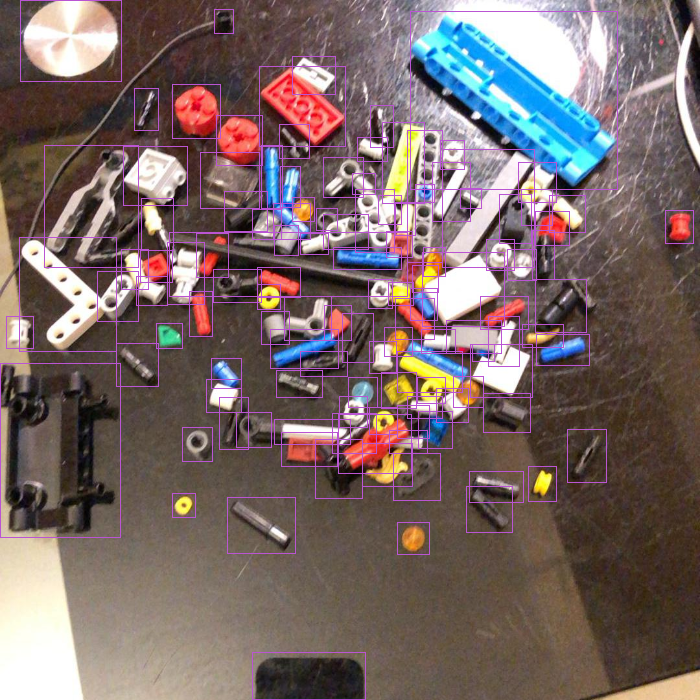

In [39]:
visualize_image_data(
    pred_images_data_detection[0], return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1
)

### Посчет метрик

In [40]:
from cv_pipeliner import get_df_detection_metrics

df_detection_metrics = get_df_detection_metrics(
    true_images_data=images_data,
    pred_images_data=pred_images_data_detection,
    minimum_iou=MINIMUM_IOU,
#     raw_pred_images_data=raw_pred_images_data_detection
)

In [41]:
df_detection_metrics

,value
images_support,10
support,736
TP,635
FP,137
FN,101
iou_mean,0.815317
accuracy,0.758662
precision,0.822539
recall,0.862772
f1_score,0.842175


# Классификация

# Как загрузить модель классификации, сделать инференс, посчитать метрики, сделать визуализацию?

In [43]:
cropped_images = [
    bbox_data.open_cropped_image(return_as_image_data=True)
    for image_data in images_data
    for bbox_data in image_data.bboxes_data
]
# В идеале не нужно хранить все в памяти, а описывать картинки через пути: ImageData(image_path=<путь к изображению>

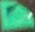

In [44]:
Image.fromarray(cropped_images[0].open_image())

### Загрузка модели

In [45]:
from cv_pipeliner import TensorFlow_ClassificationModelSpec
from cv_pipeliner import ClassificationInferencer

In [46]:
CLASSIFICATION_MODEL_SPEC = TensorFlow_ClassificationModelSpec(
    input_size=(224, 224),
    model_path='/notebooks/ceph-data/brickit-ml/2021-07-training_models/210811_2159__resnet50-size128-real-plus-crowded-renders-40percent-min-iou-0.7-more-class-names-v2-split-other-parts/model.h5',
    class_names='/notebooks/ceph-data/brickit-ml/2021-07-training_models/210811_2159__resnet50-size128-real-plus-crowded-renders-40percent-min-iou-0.7-more-class-names-v2-split-other-parts/classes.json',
    preprocess_input='/notebooks/ceph-data/brickit-ml/2021-07-training_models/210811_2159__resnet50-size128-real-plus-crowded-renders-40percent-min-iou-0.7-more-class-names-v2-split-other-parts/preprocess_input.py',
    saved_model_type='tf.keras'
)

### Загрузка инференсера, инференс

In [47]:
# Можно так:
# CLASSIFICATION_MODEL = CLASSIFICATION_MODEL_SPEC.load()
# classification_inferencer = ClassificationInferencer(CLASSIFICATION_MODEL)

# А лучше вот так:
classification_inferencer = CLASSIFICATION_MODEL_SPEC.load_classification_inferencer()

2024-08-13 20:03:52.105475: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-13 20:03:52.126250: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-13 20:03:52.126280: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-13 20:03:52.126919: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-13 20:03:52.130566: I tensorflow/core/platform/cpu_feature_guar

In [48]:
pred_cls_images_data = classification_inferencer.predict(cropped_images)

  0%|          | 0/736 [00:00<?, ?it/s]2024-08-13 20:03:54.898386: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8900
2024-08-13 20:03:54.955268: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:225] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.9
2024-08-13 20:03:54.955289: W external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:228] Used ptxas at ptxas
2024-08-13 20:03:54.955330: W external/local_xla/xla/stream_executor/gpu/redzone_allocator.cc:322] UNIMPLEMENTED: ptxas ptxas too old. Falling back to the driver to compile.
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
100%|██████████| 736/736 [00:02<00:00, 250.95it/s]


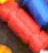

pred: 3704
===


pred: 30171
===


pred: 15210
===


pred: 3713
===


pred: not_part
===


In [49]:
for cls_image_data, pred_cls_image_data in zip(cropped_images[100:105], pred_cls_images_data[100:105]):
    display(Image.fromarray(cls_image_data.open_image()))
    print(f"pred: {pred_cls_image_data.label}")
    print("===")

In [50]:
cls_images_data = [bbox_data for image_data in images_data for bbox_data in image_data.bboxes_data]

### Посчет метрик

In [51]:
from cv_pipeliner import get_df_classification_metrics

In [52]:
len(cls_images_data)

736

In [53]:
len(images_data)

10

In [54]:
len(pred_cls_images_data)

736

In [55]:
df_classification_metrics = get_df_classification_metrics(
    n_true_bboxes_data=[cls_images_data],
    n_pred_bboxes_data=[pred_cls_images_data],
    pseudo_class_names=['other_part', 'not_part', 'part_indefinable', 'no_such_part'],
    known_class_names=classification_inferencer.class_names
)

In [56]:
df_classification_metrics

,support,precision,recall,f1_score,value,TP,FP,FN,known,pseudo
all_accuracy,736.0,NaN,NaN,NaN,0.324932,361.0,375.0,375.0,NaN,NaN
all_weighted_average,736.0,0.601532,0.490489,0.519874,NaN,361.0,375.0,375.0,NaN,NaN
all_micro_average,736.0,0.490489,0.490489,0.490489,NaN,361.0,375.0,375.0,NaN,NaN
all_macro_average,736.0,0.296464,0.287372,0.281237,NaN,361.0,375.0,375.0,NaN,NaN
all_weighted_average_without_pseudo_classes,638.0,0.69393,0.565831,0.599729,NaN,361.0,318.0,277.0,NaN,NaN
all_accuracy_without_pseudo_classes,638.0,NaN,NaN,NaN,0.377615,361.0,318.0,277.0,NaN,NaN
all_micro_average_without_pseudo_classes,638.0,0.531664,0.565831,0.548216,NaN,361.0,318.0,277.0,NaN,NaN
all_macro_average_without_pseudo_classes,638.0,0.299593,0.290405,0.284205,NaN,361.0,318.0,277.0,NaN,NaN
known_accuracy,608.0,NaN,NaN,NaN,0.367243,361.0,375.0,247.0,NaN,NaN
known_weighted_average,608.0,0.72817,0.59375,0.629321,NaN,361.0,375.0,247.0,NaN,NaN


In [57]:
del classification_inferencer

# Пайплайн

# Как загрузить модель пайплайна, сделать инференс,  провизуализировать и сделать отчет?

### Загрузка модели

In [58]:
from cv_pipeliner import PipelineModelSpec

In [59]:
PIPELINE_MODEL_SPEC = PipelineModelSpec(
    detection_model_spec=DETECTION_MODEL_SPEC,
    classification_model_spec=CLASSIFICATION_MODEL_SPEC
)

### Загрузка инференсера, инференс

In [60]:
from cv_pipeliner import PipelineInferencer

In [61]:
# Можно так:
# PIPELINE_MODEL = PIPELINE_MODEL_SPEC.load()
# pipeline_inferencer = PipelineInferencer(PIPELINE_MODEL)

# А лучше вот так:
pipeline_inferencer = PIPELINE_MODEL_SPEC.load_pipeline_inferencer()

Using cache found in /home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0
YOLOv5 🚀 2023-6-29 Python-3.11.4 torch-2.4.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16076MiB)

/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/experimental.py:79: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don

In [62]:
pred_images_data_pipeline = pipeline_inferencer.predict(
    images_data_gen=images_data_gen, 
    detection_score_threshold=DETECTION_SCORE_THRESHOLD
)

  0%|          | 0/10 [00:00<?, ?it/s]/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/common.py:702: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):

 30%|███       | 3/10 [00:03<00:08,  1.19s/it]/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/common.py:702: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):

 60%|██████    | 6/10 [00:04<00:02,  1.34it/s]/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/common.py:702: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):

 90%|█████████ | 9/10 [00:05<00:00,  1.75it/s]/home/jovyan/.cache/torch/hub/ultralytics_yolov5_v7.0/models/common.py:702: FutureWarning: `torch.cuda.amp.autocast(args...)` is de

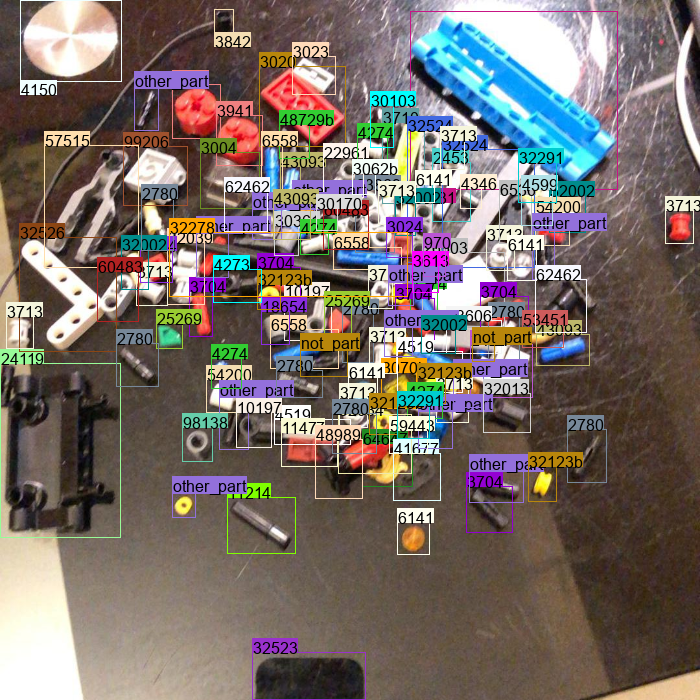

In [63]:
visualize_image_data(
    pred_images_data_pipeline[0], include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1
)

### Посчет метрик

In [64]:
from cv_pipeliner import get_df_pipeline_metrics

In [65]:
df_pipeline_metrics = get_df_pipeline_metrics(
    true_images_data=images_data,
    pred_images_data=pred_images_data_pipeline,
    minimum_iou=0.3,
    pseudo_class_names=['other_part', 'not_part', 'part_indefinable', 'no_such_part'],
    known_class_names=pipeline_inferencer.class_names
)

In [66]:
df_pipeline_metrics

,images_support,support,value,TP,FP,...,precision,recall,f1_score,known,pseudo
all_micro_average,10.0,736.0,NaN,348.0,310.0,...,0.450777,0.472826,0.461538,NaN,NaN
all_iou_mean,NaN,736.0,0.470087,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN
all_macro_average,10.0,736.0,NaN,348.0,310.0,...,0.288176,0.289384,0.27746,NaN,NaN
all_weighted_average,10.0,736.0,NaN,348.0,310.0,...,0.561467,0.472826,0.496813,NaN,NaN
all_accuracy,10.0,736.0,0.3,348.0,310.0,...,NaN,NaN,NaN,NaN,NaN
all_accuracy_without_pseudo_classes,10.0,638.0,0.364017,348.0,261.0,...,NaN,NaN,NaN,NaN,NaN
all_iou_mean_without_pseudo_classes,NaN,638.0,0.470395,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN
all_micro_average_without_pseudo_classes,10.0,638.0,NaN,348.0,261.0,...,0.522523,0.545455,0.533742,NaN,NaN
all_macro_average_without_pseudo_classes,10.0,638.0,NaN,348.0,261.0,...,0.291334,0.292555,0.280501,NaN,NaN
all_weighted_average_without_pseudo_classes,10.0,638.0,NaN,348.0,261.0,...,0.647711,0.545455,0.573126,NaN,NaN


# Сегментация (bbox + mask) 

## Пайплайн Yolov8 с сегментацией

In [67]:
from pathlib import Path
from cv_pipeliner import YOLOv8_ModelSpec, PipelineModelSpec, ImageData

In [68]:
SEGMENTATION_DETECTION_MODEL_SPEC = YOLOv8_ModelSpec(
    model_path="/notebooks/ceph-data/InTrans/models/20240625-segmentation-yolov8L/segmentation_yoloL_20240625-fixpy3.11.pt",
    class_names="/notebooks/ceph-data/InTrans/models/20240625-segmentation-yolov8L/class_names.json"
)
SEGMENTATION_DETECTION_SCORE_THRESHOLD = 0.4

In [69]:
SEGMENTATION_PIPELINE_MODEL_SPEC = PipelineModelSpec(
    detection_model_spec=SEGMENTATION_DETECTION_MODEL_SPEC,
    classification_model_spec=None
)

In [70]:
segmentation_pipeline_inferencer = SEGMENTATION_PIPELINE_MODEL_SPEC.load_pipeline_inferencer()

In [71]:
pred_segm_image_data = segmentation_pipeline_inferencer.predict(
    images_data_gen=[
        ImageData(image_path="/notebooks/ceph-data/InTrans/data/2024-06-10-new-data-from-2024-april-may/dev-dev-1712670580.8015673__zed_image_a.png")
    ],
    detection_score_threshold=SEGMENTATION_DETECTION_SCORE_THRESHOLD
)[0]

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


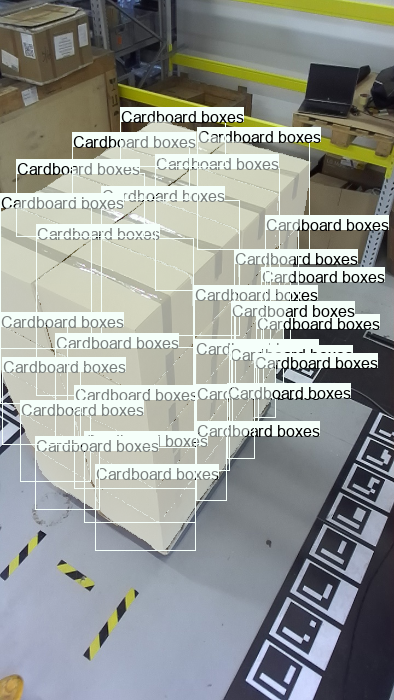

In [72]:
visualize_image_data(
    pred_segm_image_data, include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1, include_mask=True
)